# Dataset 3: Video Transcoding Time

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from scipy import stats
import seaborn as sns
import numpy as np
import math
import shap

%matplotlib inline
#warnings.filterwarnings('ignore')

In [126]:
# Load and explore raw data
df = pd.read_table('transcoding_mesurment.tsv',index_col=False) #df = pd.read_csv('transcoding_mesurment.tsv',index_col=False)

In [127]:
df.shape

(68784, 22)

In [128]:
df.head()

,id,duration,codec,width,height,bitrate,framerate,i,p,b,...,p_size,b_size,size,o_codec,o_bitrate,o_framerate,o_width,o_height,umem,utime
0,04t6-jw9czg,130.35667,mpeg4,176,144,54590,12.0,27,1537,0,...,825054,0,889537,mpeg4,56000,12.0,176,144,22508,0.612
1,04t6-jw9czg,130.35667,mpeg4,176,144,54590,12.0,27,1537,0,...,825054,0,889537,mpeg4,56000,12.0,320,240,25164,0.980
2,04t6-jw9czg,130.35667,mpeg4,176,144,54590,12.0,27,1537,0,...,825054,0,889537,mpeg4,56000,12.0,480,360,29228,1.216
3,04t6-jw9czg,130.35667,mpeg4,176,144,54590,12.0,27,1537,0,...,825054,0,889537,mpeg4,56000,12.0,640,480,34316,1.692
4,04t6-jw9czg,130.35667,mpeg4,176,144,54590,12.0,27,1537,0,...,825054,0,889537,mpeg4,56000,12.0,1280,720,58528,3.456


In [129]:
df_cat = df.select_dtypes(include='object')
df_cat.columns

Index(['id', 'codec', 'o_codec'], dtype='object')

In [130]:
#df.info()
df.describe()

,duration,width,height,bitrate,framerate,i,p,b,frames,i_size,p_size,b_size,size,o_bitrate,o_framerate,o_width,o_height,umem,utime
count,68784.000000,68784.000000,68784.000000,6.878400e+04,68784.000000,68784.000000,68784.000000,68784.000000,68784.000000,6.878400e+04,6.878400e+04,68784.0,6.878400e+04,6.878400e+04,68784.000000,68784.000000,68784.000000,68784.000000,68784.000000
mean,286.413921,624.934171,412.572226,6.937015e+05,23.241321,100.868312,6531.692210,9.147854,6641.708377,2.838987e+06,2.218057e+07,0.0,2.502294e+07,1.395036e+06,21.190862,802.336357,503.825541,228224.717900,9.996355
std,287.257650,463.169069,240.615472,1.095628e+06,7.224848,84.764791,6075.871744,92.516177,6153.342453,4.325137e+06,5.097306e+07,0.0,5.414402e+07,1.749352e+06,6.668703,609.959797,315.970438,97430.878373,16.107429
min,31.080000,176.000000,144.000000,8.384000e+03,5.705752,7.000000,175.000000,0.000000,192.000000,1.164800e+04,3.384500e+04,0.0,1.918790e+05,5.600000e+04,12.000000,176.000000,144.000000,22508.000000,0.184000
25%,106.765000,320.000000,240.000000,1.343340e+05,15.000000,39.000000,2374.000000,0.000000,2417.000000,3.933950e+05,1.851539e+06,0.0,2.258222e+06,1.090000e+05,15.000000,320.000000,240.000000,216820.000000,2.096000
50%,239.141660,480.000000,360.000000,2.911500e+05,25.021740,80.000000,5515.000000,0.000000,5628.000000,9.458650e+05,6.166260e+06,0.0,7.881069e+06,5.390000e+05,24.000000,480.000000,360.000000,219480.000000,4.408000
75%,379.320000,640.000000,480.000000,6.529670e+05,29.000000,138.000000,9155.000000,0.000000,9232.000000,3.392479e+06,1.515506e+07,0.0,1.977335e+07,3.000000e+06,25.000000,1280.000000,720.000000,219656.000000,10.433000
max,25844.086000,1920.000000,1080.000000,7.628466e+06,48.000000,5170.000000,304959.000000,9407.000000,310129.000000,9.082855e+07,7.689970e+08,0.0,8.067111e+08,5.000000e+06,29.970000,1920.000000,1080.000000,711824.000000,224.574000


### 1. Data Inspection

**Q1. Plot a heatmap of Pearson correlation matrix of dataset columns. Report which
features have the highest absolute correlation with the target variable and what
that implies.**

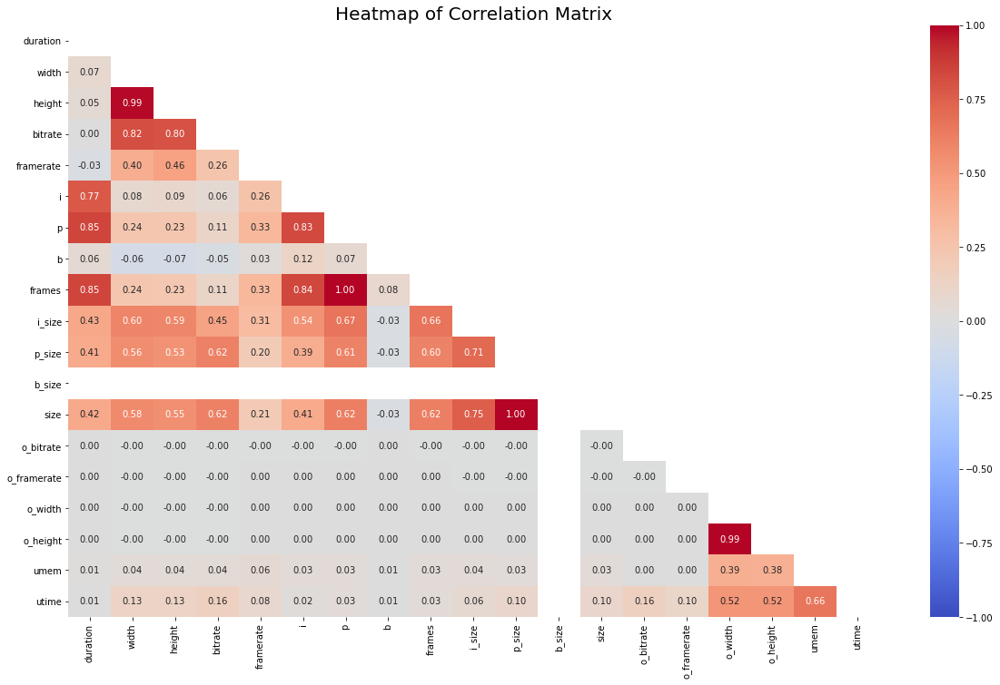

In [8]:
plt.figure(figsize=(20,12))
mask = np.triu(np.ones_like(df.corr(), dtype=bool)) # cut heatmap in half
sns.heatmap(df.corr(), annot = True,fmt='.2f',vmin=-1, vmax=1, center= 0, cmap= 'coolwarm', mask = mask);
plt.title('Heatmap of Correlation Matrix', fontsize=20);
# sns.set_context("poster")

In [110]:
df.b_size.unique()

array([0], dtype=int64)

In [131]:
#remove b_size feature as it provides no information
df = df.drop(['b_size'], axis=1) 

In [132]:
df.corr()['utime'].sort_values(ascending=False)

utime          1.000000
umem           0.663301
o_width        0.523388
o_height       0.519649
o_bitrate      0.155479
bitrate        0.155200
width          0.129861
height         0.128479
o_framerate    0.104043
p_size         0.097644
size           0.097096
framerate      0.079336
i_size         0.064711
p              0.033201
frames         0.033115
i              0.018489
duration       0.005533
b              0.005140
Name: utime, dtype: float64

**Q2: Plot the histogram of numerical features. What preprocessing can be done if the
distribution of a feature has high skewness?**

In [12]:
df_numeric = df.select_dtypes(include='number')
#df_numeric.dtypes

In [ ]:
# fig = px.histogram(df_numeric, x="Sentinel")
# fig.show()

In [25]:
# this plots multiple seaborn histograms on different subplots.
# 
def plot_multiple_histograms(df, cols):
    num_plots = len(cols)
    num_cols = math.ceil(np.sqrt(num_plots))
    num_rows = math.ceil(num_plots/num_cols)
        
    fig, axs = plt.subplots(num_rows, num_cols,figsize=(10,8))
    
    for ind, col in enumerate(cols):
        i = math.floor(ind/num_cols)
        j = ind - i*num_cols
            
        if num_rows == 1:
            if num_cols == 1:
                sns.histplot(df[col], kde=True, ax=axs)
            else:
                sns.histplot(df[col], kde=True, ax=axs[j])
        else:
            sns.histplot(df[col], kde=True, ax=axs[i, j])

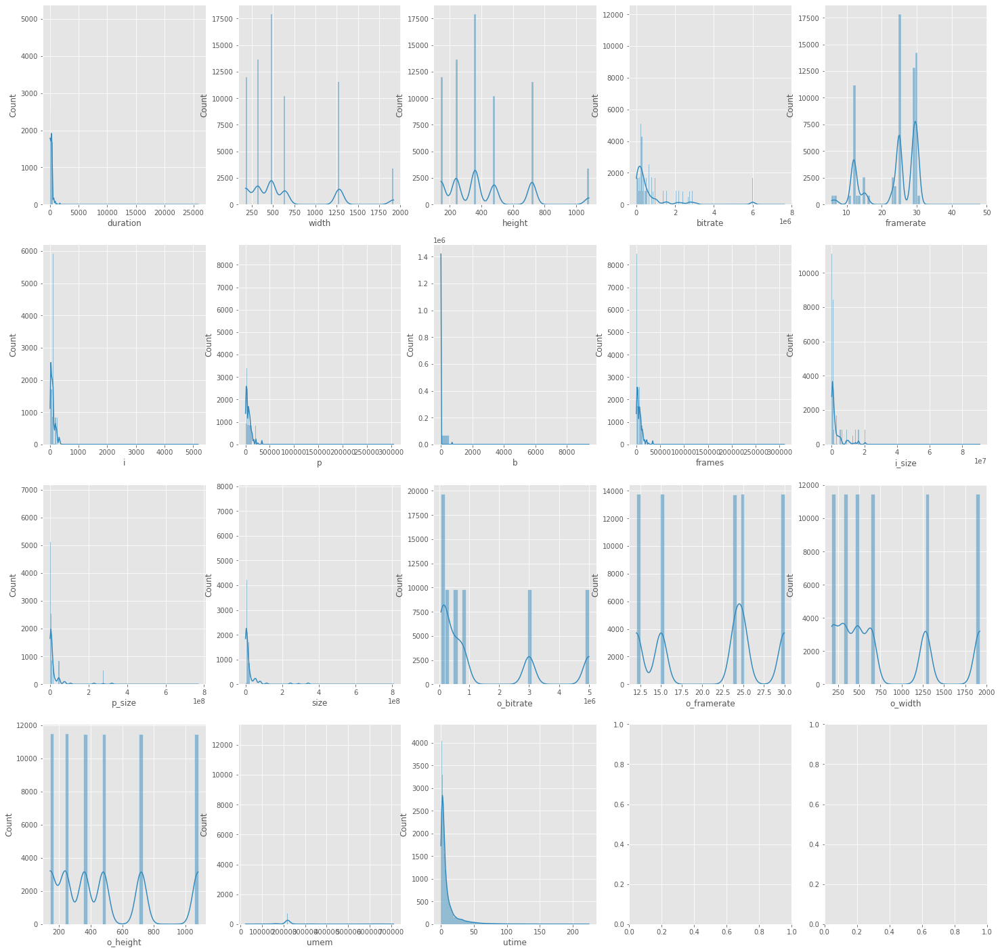

In [294]:
cols = [c for c in df_numeric.columns]
plot_multiple_histograms(df_numeric, cols)

**treatment for data skewness - log and boxcox transform**

In [13]:
df.utime.skew()

4.245501978310884

In [16]:
df.utime.skew()
utime_log = np.log(df.utime)
utime_log.skew()

0.2144115719961599

In [17]:
a = pd.Series(utime_log, dtype=np.float64, name='log')

In [19]:
utime_bc = stats.boxcox(df.utime)[0]
utime_bc = pd.Series(utime_bc)
#pd.Series(utime_bc).skew()
utime_bc.skew()

0.007659174445552319

In [20]:
b = pd.Series(utime_bc, dtype=np.float64, name='boxcox')

In [21]:
df_transform = pd.merge(a, b, right_index = True,
               left_index = True)

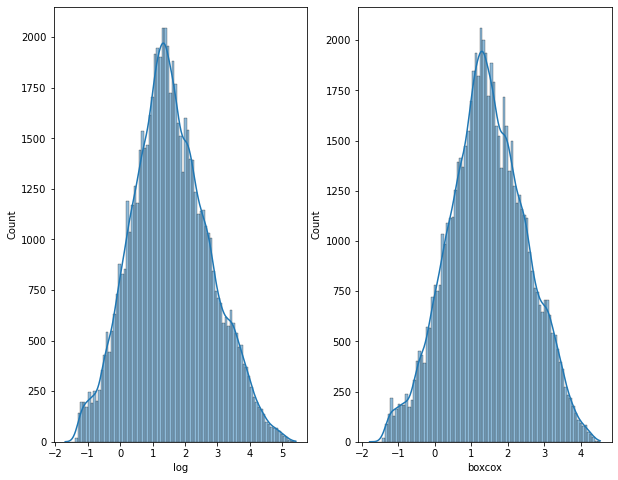

In [26]:
plot_multiple_histograms(df_transform, ['log','boxcox']) 

### log transform target variable

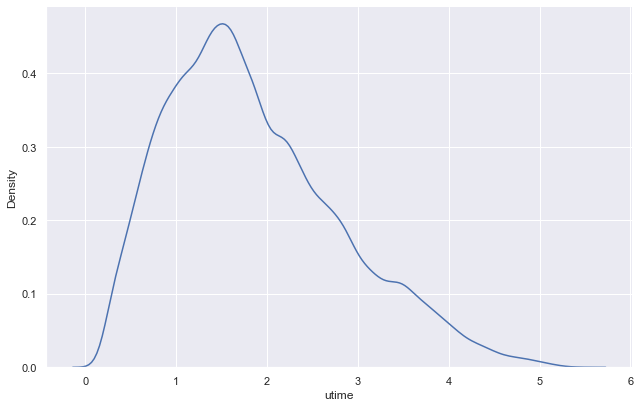

In [133]:
df["utime"] = np.log(df["utime"]+1)
sns.displot(df, x="utime", kind="kde")
plt.gcf().set_size_inches(10, 6)

**Q3: Inspect box plot of categorical features vs target variable. What intuition do you
get?**

In [202]:
df.select_dtypes(include = [object]).columns

Index(['id', 'codec', 'o_codec'], dtype='object')

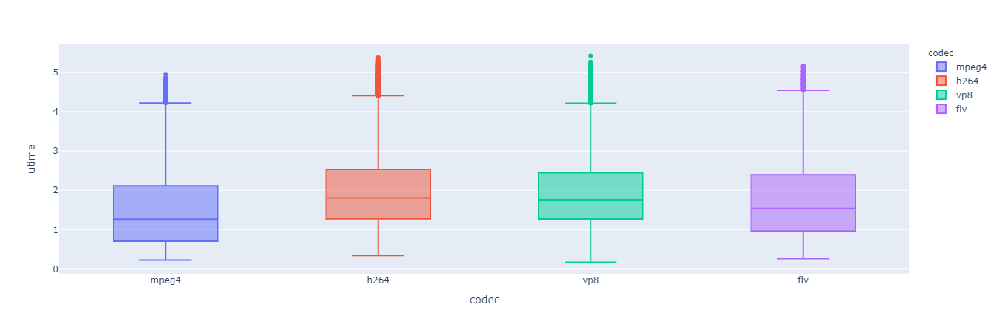

In [38]:
fig = px.box(df, x="codec", y="utime", color="codec")
fig.show()

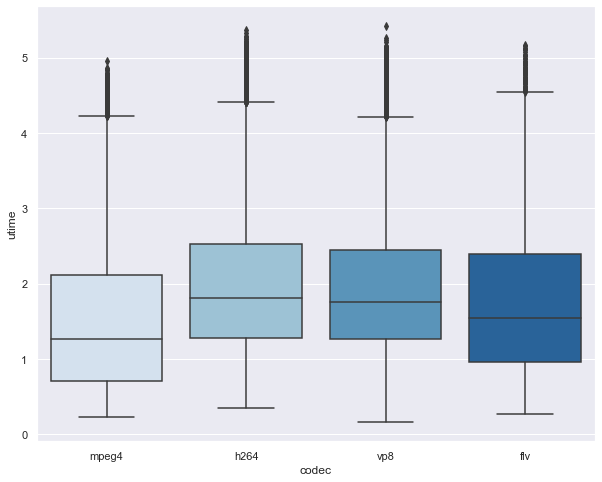

In [37]:
plt.figure(figsize=(10,8))
sns.set(style="darkgrid")
sns.boxplot(x=df['codec'], y=df['utime'], palette="Blues")
plt.show()

In [207]:
# app.run_server(mode='inline', host="localhost",port=8051)
# #app.run_server(mode='jupyterlab',port=8052)

**Q6: For video transcoding time dataset, plot the distribution of video transcoding times,
what can you observe? Report mean and median transcoding times.**

In [279]:
# # Density Plot for target video transcoding times
# plt.figure(figsize=(12,8))
# sns.distplot(df['utime'], hist=False, kde=True, 
#              bins=5, color = 'darkblue', 
#              hist_kws={'edgecolor':'black'},
#              kde_kws={'linewidth': 4});

The mean transcoding time is 9.996
The median transcoding time is 4.408


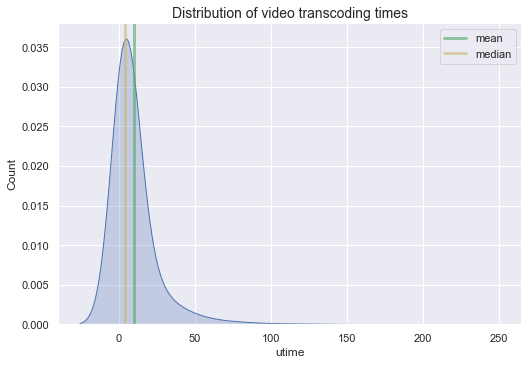

In [278]:
# set the distribution, mean and median
sns.displot(df, x="utime", kind="kde", bw_adjust=5, fill=True, height=5, aspect=1.5)
plt.axvline(x=df["utime"].mean(), linewidth=3, color='g', label="mean", alpha=0.6)
plt.axvline(x=df["utime"].median(), linewidth=3, color='y', label="median", alpha=0.6)

# set title, legends and labels
plt.xlabel("utime")
plt.ylabel("Count")
plt.title("Distribution of video transcoding times", size=14)
plt.legend(["mean", "median"]);

mean = df.utime.mean()
median = df.utime.median()
print("The mean transcoding time is", round(mean,3))
print("The median transcoding time is", round(median,3))

In [ ]:
# # matplotlib histogram
# plt.hist(flights['arr_delay'], color = 'blue', edgecolor = 'black',
#          bins = int(180/5))

# # seaborn histogram
# sns.distplot(flights['arr_delay'], hist=True, kde=False, 
#              bins=int(180/5), color = 'blue',
#              hist_kws={'edgecolor':'black'})
# # Add labels
# plt.title('Histogram of Arrival Delays')
# plt.xlabel('Delay (min)')
# plt.ylabel('Flights')

**Q7: Handling Categorical Features: For some other cases, e.g. when encoding time stamps such as {Mon, ..., Sun} or
{Jan, ..., Dec} it might make sense to perform either one. In those cases the learning
algorithm of choice and numerical results can lead our way. Can you explain a trade-off
here?**

Hint: let us assume we perform linear regression, what information does one-hot
encoding discard, and what assumption should hold strongly if we perform the scalar
encoding instead?
1) prepare categorical data using LabelEncoder() 
2) apply OneHotEncoder() on your new DataFrame in step 1

In [134]:
from sklearn.preprocessing import LabelEncoder

# creating instance of labelencoder
labelencoder = LabelEncoder()

# Assigning numerical values and storing in another column
df['codec'] = labelencoder.fit_transform(df['codec'])
df.head()

,id,duration,codec,width,height,bitrate,framerate,i,p,b,...,i_size,p_size,size,o_codec,o_bitrate,o_framerate,o_width,o_height,umem,utime
0,04t6-jw9czg,130.35667,2,176,144,54590,12.0,27,1537,0,...,64483,825054,889537,mpeg4,56000,12.0,176,144,22508,0.477476
1,04t6-jw9czg,130.35667,2,176,144,54590,12.0,27,1537,0,...,64483,825054,889537,mpeg4,56000,12.0,320,240,25164,0.683097
2,04t6-jw9czg,130.35667,2,176,144,54590,12.0,27,1537,0,...,64483,825054,889537,mpeg4,56000,12.0,480,360,29228,0.795704
3,04t6-jw9czg,130.35667,2,176,144,54590,12.0,27,1537,0,...,64483,825054,889537,mpeg4,56000,12.0,640,480,34316,0.990284
4,04t6-jw9czg,130.35667,2,176,144,54590,12.0,27,1537,0,...,64483,825054,889537,mpeg4,56000,12.0,1280,720,58528,1.494252


In [135]:
from sklearn.preprocessing import OneHotEncoder

# creating instance of one-hot-encoder
encode = OneHotEncoder(handle_unknown='ignore')

# passing codec categorical column
encode_df = pd.DataFrame(encode.fit_transform(df[['codec']]).toarray()) 

# merge with main df on key values
df = df.join(encode_df)

In [136]:
df.head()

,id,duration,codec,width,height,bitrate,framerate,i,p,b,...,o_bitrate,o_framerate,o_width,o_height,umem,utime,0,1,2,3
0,04t6-jw9czg,130.35667,2,176,144,54590,12.0,27,1537,0,...,56000,12.0,176,144,22508,0.477476,0.0,0.0,1.0,0.0
1,04t6-jw9czg,130.35667,2,176,144,54590,12.0,27,1537,0,...,56000,12.0,320,240,25164,0.683097,0.0,0.0,1.0,0.0
2,04t6-jw9czg,130.35667,2,176,144,54590,12.0,27,1537,0,...,56000,12.0,480,360,29228,0.795704,0.0,0.0,1.0,0.0
3,04t6-jw9czg,130.35667,2,176,144,54590,12.0,27,1537,0,...,56000,12.0,640,480,34316,0.990284,0.0,0.0,1.0,0.0
4,04t6-jw9czg,130.35667,2,176,144,54590,12.0,27,1537,0,...,56000,12.0,1280,720,58528,1.494252,0.0,0.0,1.0,0.0


**Q8: Standardize feature columns and prepare them for training.**

Standardization of datasets is a common requirement for many machine learning estimators; they might behave badly if the individual features do not more-or-less look like
standard normally distributed data: Gaussian with zero mean and unit variance. If a feature has a variance that is orders of magnitude larger than others, it might dominate the objective function and make the estimator unable to learn from other features correctly
as expected. (Note: Tree-based models are usually not dependent on scaling.)

In [292]:
# from sklearn.preprocessing import StandardScaler

# # 4 samples/observations and 2 variables/features
# X = np.array([[0, 0], [1, 0], [0, 1], [1, 1]])
# # the scaler object (model)
# scaler = StandardScaler()
# # fit and transform the data
# scaled_data = scaler.fit_transform(X) 

In [137]:
from sklearn.preprocessing import StandardScaler

# make a copy of dataframe
df_scaled = df.copy()

# Use standard scaler on numerical features
scaler = StandardScaler()
numeric_cols = list(df_scaled.dtypes[df_scaled.dtypes != 'object'].index)
df_scaled.loc[:,numeric_cols] = scaler.fit_transform(df_scaled.loc[:,numeric_cols])

In [138]:
df_scaled.head()
#df_scaled.mean(axis = 0)
#df_scaled.std(axis = 0)

,id,duration,codec,width,height,bitrate,framerate,i,p,b,...,o_bitrate,o_framerate,o_width,o_height,umem,utime,0,1,2,3
0,04t6-jw9czg,-0.54327,0.395869,-0.969273,-1.116197,-0.583333,-1.555936,-0.871457,-0.82206,-0.098879,...,-0.765453,-1.378218,-1.026856,-1.138803,-2.111427,-1.440823,-0.332299,-0.920378,2.173999,-0.604022
1,04t6-jw9czg,-0.54327,0.395869,-0.969273,-1.116197,-0.583333,-1.555936,-0.871457,-0.82206,-0.098879,...,-0.765453,-1.378218,-0.790773,-0.834975,-2.084167,-1.225630,-0.332299,-0.920378,2.173999,-0.604022
2,04t6-jw9czg,-0.54327,0.395869,-0.969273,-1.116197,-0.583333,-1.555936,-0.871457,-0.82206,-0.098879,...,-0.765453,-1.378218,-0.528459,-0.455190,-2.042455,-1.107781,-0.332299,-0.920378,2.173999,-0.604022
3,04t6-jw9czg,-0.54327,0.395869,-0.969273,-1.116197,-0.583333,-1.555936,-0.871457,-0.82206,-0.098879,...,-0.765453,-1.378218,-0.266145,-0.075405,-1.990233,-0.904142,-0.332299,-0.920378,2.173999,-0.604022
4,04t6-jw9czg,-0.54327,0.395869,-0.969273,-1.116197,-0.583333,-1.555936,-0.871457,-0.82206,-0.098879,...,-0.765453,-1.378218,0.783112,0.684165,-1.741727,-0.376716,-0.332299,-0.920378,2.173999,-0.604022


In [44]:
df_scaled.shape

(68784, 25)

### 2. Feature Selection

mutual_info_regression and f_regression

**Q9：You may use these functions to select most important features. How does this step affect
the performance of your models in terms of test RMSE?**

In [139]:
#Divide the features into Independent and Dependent Variable; # drop target variable and categorical variable
X = df_scaled.drop(['utime', 'id', 'o_codec'], axis=1) 
y = df_scaled['utime']

In [140]:
from sklearn.feature_selection import mutual_info_regression

threshold = 10  # the number of most relevant features
high_score_features = []
feature_scores = mutual_info_regression(X, y, random_state=0)

for score, f_name in sorted(zip(feature_scores, X.columns), reverse=True)[:threshold]:
        print(f_name, score)
        high_score_features.append(f_name)
df_MI = X[high_score_features]
print(df_MI.columns)

umem 0.3673592102485759
p 0.31749153853184
frames 0.31639935801591346
bitrate 0.31636909373777655
o_height 0.31237194406346536
duration 0.3099443359163505
o_width 0.3094860645132531
i_size 0.30646193125832166
i 0.3004272631582632
size 0.29613166657698375
Index(['umem', 'p', 'frames', 'bitrate', 'o_height', 'duration', 'o_width',
       'i_size', 'i', 'size'],
      dtype='object')


In [80]:
X.columns

Index([   'duration',       'codec',       'width',      'height',
           'bitrate',   'framerate',           'i',           'p',
                 'b',      'frames',      'i_size',      'p_size',
              'size',     'o_codec',   'o_bitrate', 'o_framerate',
           'o_width',    'o_height',        'umem',             0,
                   1,             2,             3],
      dtype='object')

In [82]:
from sklearn.feature_selection import f_regression
threshold = 15 # the number of most relevant features
high_score_features = []
feature_scores = f_regression(X, y)[0]

for score, f_name in sorted(zip(feature_scores, X.columns), reverse=True)[:threshold]:
      print(f_name, score)
      high_score_features.append(f_name)
df_f_regression = X[high_score_features]
print(df_f_regression.columns)

o_height 47846.895299207245
o_width 46933.41057164111
umem 24031.970881526122
bitrate 5569.121179624473
height 5367.719138035693
width 5357.081912494883
size 2343.7022511010427
p_size 2310.4361197599364
2 2113.0776827947475
framerate 1992.4301919345114
i_size 1537.3597507133004
o_framerate 1045.7360907327543
1 873.9539864496553
o_bitrate 666.8690620652461
p 391.7574662971909
Index([   'o_height',     'o_width',        'umem',     'bitrate',
            'height',       'width',        'size',      'p_size',
                   2,   'framerate',      'i_size', 'o_framerate',
                   1,   'o_bitrate',           'p'],
      dtype='object')


In [307]:
#p.log([100, 1, np.e, np.e**2, 0.01, 0])

## Training

Once the data is prepared, we would like to **train multiple algorithms and compare their performance using average RMSE from 10-fold cross-validation.**

#### 1. Linear Regression

In [52]:
all_features = list(X_train.select_dtypes(include='number'))

In [58]:
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

X = X_train[all_features].values
y = y_train.values

regressor = LinearRegression()
regressor.fit(X, y)

# Predicting the Test set results
y_pred = regressor.predict(X_test[all_features])
model1 = sm.OLS(y,X)
result = model1.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.598
Model:                            OLS   Adj. R-squared:                  0.598
Method:                 Least Squares   F-statistic:                     3769.
Date:                Wed, 09 Jun 2021   Prob (F-statistic):               0.00
Time:                        16:19:13   Log-Likelihood:                -44048.
No. Observations:               48148   AIC:                         8.814e+04
Df Residuals:                   48128   BIC:                         8.831e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.0001   2.88e-05      3.769      0.0

In [59]:
print('R2 score:', metrics.r2_score(y_test,y_pred))
print('Mean Absolute Error (MAE):', metrics.mean_absolute_error(y_test,y_pred))
print('Mean Squared Error (MSE):', metrics.mean_squared_error(y_test,y_pred))
print('Root Mean Squared Error (RMSE):', np.sqrt(metrics.mean_squared_error(y_test,y_pred)))
print('Mean Absolute Percentage Error (MAPE):', metrics.mean_absolute_percentage_error(y_test,y_pred))

R2 score: 0.59889916117929
Mean Absolute Error (MAE): 0.49001756189921797
Mean Squared Error (MSE): 0.37112577817655434
Root Mean Squared Error (RMSE): 0.6092009341560093
Mean Absolute Percentage Error (MAPE): 0.3800205320160676


In [156]:
# using 10 key features
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

X = X_train[key_cols].values
y = y_train.values

regressor = LinearRegression()
regressor.fit(X, y)

# Predicting the Test set results
y_pred = regressor.predict(X_test[key_cols])
model1 = sm.OLS(y,X)
result = model1.fit()
print(result.summary())

<ipython-input-156-7a0043bca9c6>:12: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [61]:
print('R2 score:', metrics.r2_score(y_test,y_pred))
print('Mean Absolute Error (MAE):', metrics.mean_absolute_error(y_test,y_pred))
print('Mean Squared Error (MSE):', metrics.mean_squared_error(y_test,y_pred))
print('Root Mean Squared Error (RMSE):', np.sqrt(metrics.mean_squared_error(y_test,y_pred)))
print('Mean Absolute Percentage Error (MAPE):', metrics.mean_absolute_percentage_error(y_test,y_pred))

R2 score: 0.5651413683410231
Mean Absolute Error (MAE): 0.5087723741429958
Mean Squared Error (MSE): 0.40236078424998933
Root Mean Squared Error (RMSE): 0.634319150152342
Mean Absolute Percentage Error (MAPE): 0.3994891027488252


In [35]:
# intercept value 
regressor.intercept_ 

-26.607311161238222

In [36]:
# coefficients value Beta
regressor.coef_ 

array([ 5.50176797e-04,  8.70219100e-03, -1.56119902e-02,  1.67552762e-06,
        7.75183394e-02, -1.78488844e-03,  3.98779961e-04,  1.01430446e-03,
       -3.71804021e-04, -5.04941331e-07, -3.38432717e-07,  7.28583860e-17,
        3.43994285e-07,  1.41062364e-06,  2.53816537e-01,  5.04112273e-03,
        6.31100602e-03,  8.88143149e-05])

In [39]:
# Visualising the Training set results
# plt.scatter(X, y, color = 'red')
# plt.plot(X_train, regressor.predict(X_test[key_cols]), color = 'blue')

In [ ]:
# Visualising the Test set results
# plt.scatter(X_test, y_test, color = 'red')
# plt.plot(X_train, regressor.predict(X_train), color = 'blue')
# plt.title('Salary vs Experience (Test set)')
# plt.xlabel('Years of Experience')
# plt.ylabel('Salary')
# plt.show()

#### 2. Polynomial Regression

#### 3. Neural Network

#### 4. Random Forest

In [119]:
from sklearn.model_selection import train_test_split
X = df.drop(['utime','id','codec','o_codec'],axis=1) # Independet variable
y = df['utime'] # dependent variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=43)

In [ ]:
#Standardized version
from sklearn.model_selection import train_test_split
X = df_scaled.drop(['utime','id','codec','o_codec'],axis=1) # Independet variable
y = df_scaled['utime'] # dependent variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=43)

In [120]:
print('Training Features Shape:', X_train.shape)
print('Training Labels Shape:', y_train.shape)
print('Testing Features Shape:', X_test.shape)
print('Testing Labels Shape:', y_test.shape)

Training Features Shape: (48148, 21)
Training Labels Shape: (48148,)
Testing Features Shape: (20636, 21)
Testing Labels Shape: (20636,)


In [141]:
# Saving feature names for later use
feature_list = list(df.columns)
key_cols = df_MI.columns.tolist() #['umem', 'p', 'frames', 'p_size', 'bitrate', 'size', 'i_size','duration', 'o_width', 'o_height'] # from feature importance

In [70]:
len(feature_list)

25

**Q21: Fine-tune your model. Explain how these hyper-parameters affect the overall performance? Do some of them have regularization effect?**

In [122]:
#Grid Search Cross Validation for best parameters
from sklearn.model_selection import GridSearchCV

X = X_train.values
y = y_train.values

forest1 =  RandomForestRegressor(oob_score=True,random_state=42)

gsc = GridSearchCV(
        estimator=forest1,
        param_grid={
            'max_depth': range(4,5),
            'n_estimators': (10, 50, 100, 200, 500),
            'max_features': ('auto', 10, 15, 20)
        },
        cv=4, scoring='neg_root_mean_squared_error', verbose=0,  n_jobs=-1)
    
grid_result = gsc.fit(X, y)
best_params = grid_result.best_params_

In [123]:
best_params

{'max_depth': 4, 'max_features': 10, 'n_estimators': 50}

**Q22: Why does random forest perform well?**

**Q23: Randomly pick a tree in your random forest model (with maximum depth of 4) and
plot its structure. Which feature is selected for branching at the root node? What
can you infer about the importance of features? Do the important features match
what you got in part 4.2.1?**

In [143]:
# visualize the random forest
from sklearn import tree
from sklearn.ensemble import RandomForestRegressor
import graphviz 

key_cols = df_f_regression.columns.tolist() # from feature importance

forest1 =  RandomForestRegressor(oob_score=True,
                               max_features=15,max_depth=4,
                               random_state=42)

forest1.set_params(n_estimators=50)
X = X_train[key_cols].values
y = y_train.values

forest1.fit(X, y)
tree1 = forest1.estimators_[2] # randomly pick a tree
dot_data = tree.export_graphviz(tree1, out_file=None, feature_names=key_cols, 
                                class_names="utime",   filled=True, rounded=True,  special_characters=True)
graph = graphviz.Source(dot_data)
graph.render('random_forest.png', view=False)

'random_forest.png.pdf'

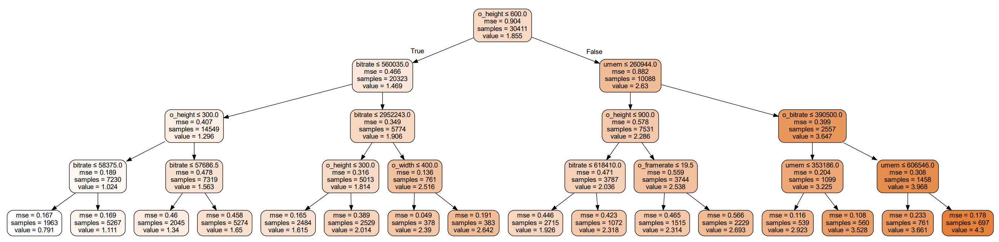

In [144]:
#Predicting the Test set results
X_test = X_test[key_cols].values
y_pred = forest1.predict(X_test)

In [145]:
# R2 score
forest1.score(X_test,y_test)
#metrics.r2_score(y_test,y_pred)

0.6439522887513724

In [157]:
print('R2 score:', metrics.r2_score(y_test,y_pred))
print('Mean Absolute Error (MAE):', metrics.mean_absolute_error(y_test,y_pred))
print('Mean Squared Error (MSE):', metrics.mean_squared_error(y_test,y_pred))
print('Root Mean Squared Error (RMSE):', np.sqrt(metrics.mean_squared_error(y_test,y_pred)))
print('Mean Absolute Percentage Error (MAPE):', metrics.mean_absolute_percentage_error(y_test,y_pred))

R2 score: 0.6439522887513724
Mean Absolute Error (MAE): 0.451602133525856
Mean Squared Error (MSE): 0.329439560120674
Root Mean Squared Error (RMSE): 0.5739682570671256
Mean Absolute Percentage Error (MAPE): 0.35670747349767185


In [148]:
from numpy import mean
from numpy import std
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold

# evaluate the model
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=42)
n_scores = cross_val_score(forest1, X, y, scoring='neg_root_mean_squared_error', cv=cv, n_jobs=-1, error_score='raise') #using all processors

# report performance
print('RMSE: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))

RMSE: -0.572 (0.005)


In [152]:
rf_feature_importance = (
    pd.DataFrame({
        'feature': key_cols,
        'importance': forest1.feature_importances_,
    })
    .sort_values('importance', ascending=False)
)

In [154]:
rf_feature_importance.head(10)

,feature,importance
1,o_width,0.345899
0,o_height,0.278187
2,umem,0.211546
3,bitrate,0.133706
13,o_bitrate,0.019430
11,o_framerate,0.006398
5,width,0.002469
4,height,0.002193
9,framerate,0.000117
12,1,0.000054


#### 5. LightGBM, CatBoost with Bayesian Optimization

**Q24: Read the documentation of LightGBM and CatBoost and experiment on the picked
dataset to determined the important hyperparameters along with a proper search
space for the tuning of these parameters.**

In [2]:
import lightgbm as lgb
from sklearn import metrics

In [3]:
# Load and explore raw data
df = pd.read_table('transcoding_mesurment.tsv',index_col=False) #df = pd.read_csv('transcoding_mesurment.tsv',index_col=False)

In [4]:
#remove b_size feature as it provides no information
df = df.drop(['b_size'], axis=1) 

### lognormal target variable

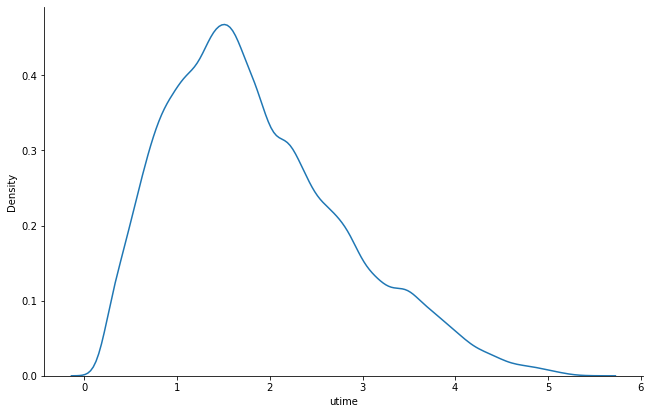

In [5]:
df["utime"] = np.log(df["utime"]+1)
sns.displot(df, x="utime", kind="kde")
plt.gcf().set_size_inches(10, 6)

In [ ]:
# Standardization

# # make a copy of dataframe
# df_scaled = df.copy()

# # Use standard scaler on numerical features
# scaler = StandardScaler()
# numeric_cols = list(df_scaled.dtypes[df_scaled.dtypes != 'object'].index)
# df_scaled.loc[:,numeric_cols] = scaler.fit_transform(df_scaled.loc[:,numeric_cols])

In [6]:
from sklearn.model_selection import train_test_split
X = df.drop(['utime','id','o_codec'],axis=1) # Independet variable
y = df['utime'] # dependent variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=43)

In [ ]:
#Standardized Version
# from sklearn.model_selection import train_test_split
# X = df.drop(['utime','id','o_codec'],axis=1) # Independet variable
# y = df['utime'] # dependent variable

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=43)

In [7]:
categorical_features =  np.where(X_train.dtypes == object)[0]
pos = categorical_features
colname = X_train.columns[pos]
print (colname)

Index(['codec'], dtype='object')


In [13]:
# #convert to category dtype
for col in ['codec']:
    X_train[col] = X_train[col].astype('category')

for col in ['codec']:
    X_test[col] = X_test[col].astype('category')

In [11]:
import lightgbm as lgb
from sklearn import metrics
#from sklearn.metrics import mean_squared_error

cat_val = ['codec']

print('Training Start...')
# train

evals_result = {}  # to record eval results for plotting

lgbm = lgb.LGBMRegressor(num_leaves=31,
                        learning_rate=0.05,
                        n_estimators=500)
lgbm.fit(X_train, y_train,
        eval_set=[(X_test, y_test), (X_train, y_train)],
        eval_metric='l1', #MAE
        categorical_feature=cat_val,
        #evals_result=evals_result,
        early_stopping_rounds=5)

print('Starting predicting...')

# predict
y_pred = lgbm.predict(X_test, num_iteration=lgbm.best_iteration_)

# eval
print('The rmse of prediction is:', metrics.mean_squared_error(y_test, y_pred, squared=False)) #rmse

# feature importances
print('Feature importances:', list(lgbm.feature_importances_))


Training Start...
[1]	training's l1: 0.742693	training's l2: 0.849186	valid_0's l1: 0.751671	valid_0's l2: 0.86536
Training until validation scores don't improve for 5 rounds
[2]	training's l1: 0.720391	training's l2: 0.796436	valid_0's l1: 0.729131	valid_0's l2: 0.811392
[3]	training's l1: 0.699657	training's l2: 0.748604	valid_0's l1: 0.708165	valid_0's l2: 0.762401
[4]	training's l1: 0.680371	training's l2: 0.705398	valid_0's l1: 0.688664	valid_0's l2: 0.718178
[5]	training's l1: 0.662292	training's l2: 0.666423	valid_0's l1: 0.670384	valid_0's l2: 0.678411
[6]	training's l1: 0.645355	training's l2: 0.631166	valid_0's l1: 0.653249	valid_0's l2: 0.642329
[7]	training's l1: 0.629507	training's l2: 0.599259	valid_0's l1: 0.637175	valid_0's l2: 0.609694
[8]	training's l1: 0.614661	training's l2: 0.570297	valid_0's l1: 0.622128	valid_0's l2: 0.580133
[9]	training's l1: 0.600793	training's l2: 0.54417	valid_0's l1: 0.608065	valid_0's l2: 0.553366

Using categorical_feature in Dataset.
categorical_feature in Dataset is overridden.
New categorical_feature is ['codec']
Overriding the parameters from Reference Dataset.
categorical_column in param dict is overridden.



[10]	training's l1: 0.587766	training's l2: 0.520473	valid_0's l1: 0.594812	valid_0's l2: 0.52904
[11]	training's l1: 0.575646	training's l2: 0.498968	valid_0's l1: 0.582519	valid_0's l2: 0.507063
[12]	training's l1: 0.564197	training's l2: 0.479491	valid_0's l1: 0.57098	valid_0's l2: 0.487238
[13]	training's l1: 0.553569	training's l2: 0.461715	valid_0's l1: 0.560176	valid_0's l2: 0.469024
[14]	training's l1: 0.543545	training's l2: 0.44561	valid_0's l1: 0.549998	valid_0's l2: 0.452548
[15]	training's l1: 0.534243	training's l2: 0.43096	valid_0's l1: 0.540484	valid_0's l2: 0.437527
[16]	training's l1: 0.525597	training's l2: 0.417593	valid_0's l1: 0.531644	valid_0's l2: 0.423747
[17]	training's l1: 0.517516	training's l2: 0.405527	valid_0's l1: 0.52336	valid_0's l2: 0.411441
[18]	training's l1: 0.50989	training's l2: 0.3945	valid_0's l1: 0.515627	valid_0's l2: 0.40021
[19]	training's l1: 0.502906	training's l2: 0.384531	valid_0's l1: 0.508468	valid_0's l2: 0.390002
[20]	training's l1

In [12]:
lgbm.best_iteration_

308

In [13]:
df_feature_importance = (
    pd.DataFrame({
        'feature': lgbm.feature_name_,
        'importance': lgbm.feature_importances_,
    })
    .sort_values('importance', ascending=False)
)

In [14]:
df_feature_importance[:11]

,feature,importance
17,umem,3468
15,o_width,1392
13,o_bitrate,995
4,bitrate,570
0,duration,470
14,o_framerate,457
11,p_size,371
10,i_size,326
5,framerate,300
6,i,259


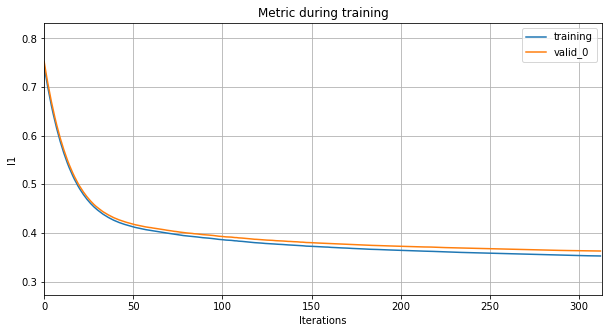

In [15]:
ax = lgb.plot_metric(lgbm.evals_result_, metric='l1', figsize=(10, 5))
plt.show()

**Q25: Apply Bayesian optimization using skopt.BayesSearchCV from scikit-optmize
to search good hyperparameter combinations in your search space. Report the best
hyperparameter found and the corresponding RMSE, for both algorithms.**

For LightGBM, we’ll optimize num_boost_round, num_leaves, max_depth, lambda_l2, lambda_l1, min_child_samples, and min_data_in_leaf.

For CatBoost, we’ll optimize depth, l2_leaf_reg, and num_boost_round.

In [11]:
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold

lgbm = lgb.LGBMRegressor()

# from that dimension (`'log-uniform'` for the learning rate)
SEARCH_SPACES = {'learning_rate': (0.1, 1.0, 'log-uniform'),
        'num_leaves': (2, 500),
        'max_depth': (0, 500),
        'min_child_samples': (0, 200),
        'max_bin': (100, 100000),
        'lambda_l2': (0.0, 0.1),
        'lambda_l1': (0.0, 0.1),
        'min_child_samples': (50, 10000),
        'min_data_in_leaf': (100, 2000),
        'n_estimators': (10, 10000),
        }

BayesOptimizer = BayesSearchCV(estimator=lgbm,
                                  search_spaces=SEARCH_SPACES,
                                  scoring=None,
                                  n_iter=5,
                                  cv=3,
                                  verbose=2
                                 )
BayesOptimizer.fit(X_train, y_train)


Fitting 3 folds for each of 1 candidates, totalling 3 fits
[CV] END lambda_l1=0.018806153049885872, lambda_l2=0.007613601200973343, learning_rate=0.16696375417654544, max_bin=73600, max_depth=115, min_child_samples=66, min_data_in_leaf=1224, n_estimators=5164, num_leaves=396; total time=  15.2s
[LightGBM] [Warning] min_data_in_leaf is set=1224, min_child_samples=66 will be ignored. Current value: min_data_in_leaf=1224
[LightGBM] [Warning] lambda_l1 is set=0.018806153049885872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.018806153049885872
[LightGBM] [Warning] lambda_l2 is set=0.007613601200973343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007613601200973343
[CV] END lambda_l1=0.018806153049885872, lambda_l2=0.007613601200973343, learning_rate=0.16696375417654544, max_bin=73600, max_depth=115, min_child_samples=66, min_data_in_leaf=1224, n_estimators=5164, num_leaves=396; total time=  18.9s
[LightGBM] [Warning] min_data_in_leaf is set=1224, min_child_sampl

In [12]:
print("BayesSearchCV ran for %d candidates"
          " parameter settings." % (BayesOptimizer.total_iterations))

print("val. score: %s" % BayesOptimizer.best_score_)
print("test score: %s" % BayesOptimizer.score(X_train, y_train))
print(BayesOptimizer.best_params_)

BayesSearchCV ran for 45 candidates parameter settings.
val. score: 0.7237840508702201
test score: 0.7581757466697607
OrderedDict([('lambda_l1', 0.06454180978067929), ('lambda_l2', 0.0038607015054071166), ('learning_rate', 0.13085110778773582), ('max_bin', 27523), ('max_depth', 444), ('min_child_samples', 547), ('min_data_in_leaf', 1316), ('n_estimators', 2675), ('num_leaves', 500)])


### CatBoost Regressor

In [17]:
from catboost import CatBoostRegressor

cat_val = ['codec']

params = {'iterations':5000,
        'learning_rate':0.001,
        'depth':3,
        'loss_function':'RMSE',
        'eval_metric':'RMSE',
        'random_seed':55,
        'cat_features':cat_val,
        'metric_period':200,  
        'od_type':"Iter",  
        'od_wait':20,  
        'verbose':True,
        'use_best_model':True}

Cat_regressor = CatBoostRegressor(**params)

Cat_regressor.fit(X_train, y_train, 
          eval_set=(X_test, y_test),  
          use_best_model=True,  
          plot= True   
         );

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.9522772	test: 0.9614119	best: 0.9614119 (0)	total: 39.6ms	remaining: 3m 18s
200:	learn: 0.8667921	test: 0.8745913	best: 0.8745913 (200)	total: 2.98s	remaining: 1m 11s
400:	learn: 0.8023677	test: 0.8089536	best: 0.8089536 (400)	total: 6.41s	remaining: 1m 13s
600:	learn: 0.7520985	test: 0.7576827	best: 0.7576827 (600)	total: 10.6s	remaining: 1m 17s
800:	learn: 0.7123172	test: 0.7171262	best: 0.7171262 (800)	total: 14.3s	remaining: 1m 14s
1000:	learn: 0.6817426	test: 0.6860710	best: 0.6860710 (1000)	total: 17.7s	remaining: 1m 10s
1200:	learn: 0.6579775	test: 0.6618879	best: 0.6618879 (1200)	total: 21.8s	remaining: 1m 8s
1400:	learn: 0.6390385	test: 0.6426242	best: 0.6426242 (1400)	total: 26.1s	remaining: 1m 7s
1600:	learn: 0.6236782	test: 0.6270366	best: 0.6270366 (1600)	total: 30.7s	remaining: 1m 5s
1800:	learn: 0.6109047	test: 0.6140933	best: 0.6140933 (1800)	total: 34.7s	remaining: 1m 1s
2000:	learn: 0.6001116	test: 0.6031551	best: 0.6031551 (2000)	total: 38.9s	remaining: 5

In [18]:
shap_values = shap.TreeExplainer(Cat_regressor).shap_values(X_train)

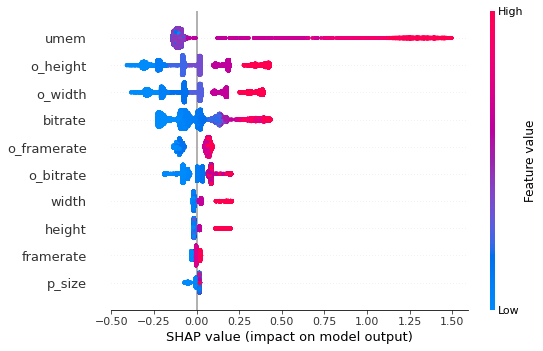

In [20]:
#CatBoost feature importance SHAP
shap.summary_plot(shap_values, X_train, max_display=10)

**Q26: Interpret the effect of the hyperparameters using the Bayesian optimization results: Which of them helps with performance? Which helps with regularization (shrinks
the generalization gap)? Which affects the fitting efficiency? Endorse your interpretation with numbers and visualizations.**

In [176]:
## lightGBM SHAP
shap_values = shap.TreeExplainer(lgbm).shap_values(X_train)

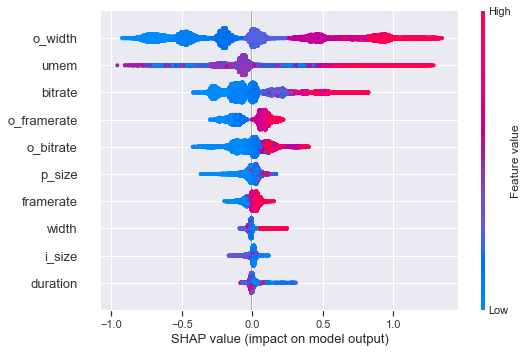

In [177]:
##lightGBM feature importance SHAP
shap.summary_plot(shap_values, X_train, max_display=10)

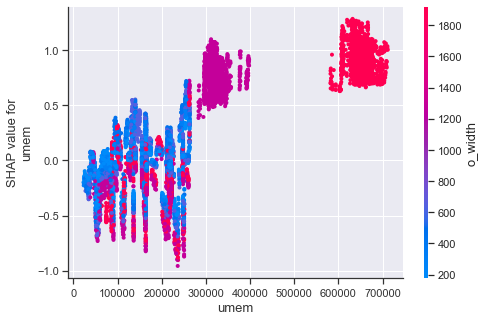

In [179]:
shap.dependence_plot("umem", shap_values, X_train) #, alpha=0.5

### Evaluation

**Q27: Perform 10-fold cross-validation and measure average RMSE errors for training and validation sets. Why is the training RMSE different from that of validation set?**

**Q28: For random forest model, measure “Out-of-Bag Error” (OOB) as well. Explain what OOB error and R2 score means.**

In [158]:
#OOB error
oob_error = round((1 - forest1.oob_score_),3)
print("The Out-of-Bag Error for the Video Transcoding dataset is", oob_error)

The Out-of-Bag Error for the Video Transcoding dataset is 0.361
